In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import sys
import h5py
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

In [4]:
import cupy as cp

In [7]:
PROJECT_PATH = '../'
PCP_PATH = '/scratch/ceph/szalay/swei20/AE/PCP_HL.h5'
PCP20_PATH = '/scratch/ceph/szalay/swei20/AE/PCP_FLUX_HL20.h5'
NORM_PATH = "/scratch/ceph/szalay/swei20/AE/norm_flux_step4.h5"
sys.path.insert(0, PROJECT_PATH)

In [8]:
# os.environ["CUDA_VISIBLE_DEVICES"] = "2"

### Load data

In [9]:
with h5py.File(NORM_PATH, 'r') as f:
    flux0 = f['flux'][()]
    para0 = f['para'][()]
    wave0 = f['wave'][()]

In [10]:
flux0.shape, wave0.shape

((116614, 3850), (3850,))

In [11]:
from lv.base.dataloader_c import DataLoader

In [12]:
ds = DataLoader()

In [13]:
ds.prepare_data (flux0, wave0, para0, "H", "L", fix_CO=0)

Cupy flux: 80442, wave: 686


In [17]:
mask0=ds.get_major(k=5, q=0.6, niter=1)

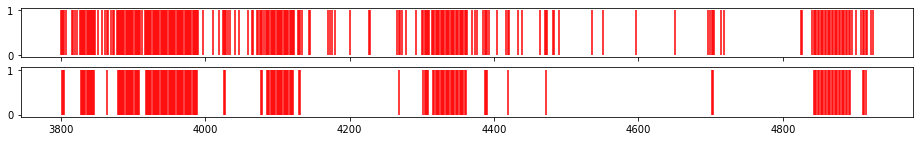

In [18]:
ds.plot_eroded_mask(mask0)

In [19]:
ds.get_MN(ds.mask, top=5)

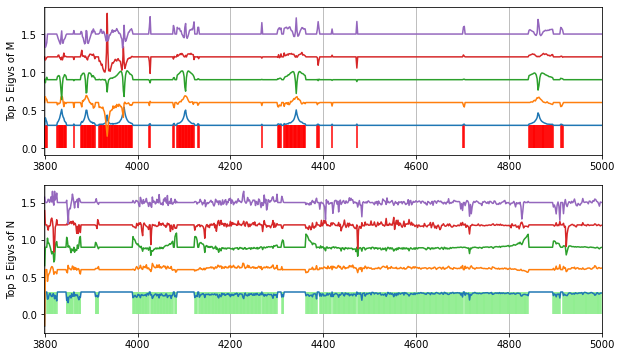

In [20]:
f, axs = plt.subplots(2,1,figsize=(10,6))
ds.plot_MN(step=0.3, axs=axs)

In [21]:
ML, MS, MLv, MSv = ds._pcp(ds.M, delta=1e-6, mu=None, lam=None, norm=None, maxiter=500)

3.4084654 0.003525807279719099 2765802.8


In [22]:
paraa = ds.dfpara.values

In [23]:
with h5py.File(PCP_PATH, 'w') as f:
    f.create_dataset("flux", data=cp.asnumpy(ds.flux), shape=ds.flux.shape)
    f.create_dataset("wave", data=cp.asnumpy(ds.wave), shape=ds.wave.shape)
    f.create_dataset("para", data=paraa, shape=paraa.shape) 
    f.create_dataset("ML", data=cp.asnumpy(ML), shape=ML.shape)
    f.create_dataset("MS", data=cp.asnumpy(MS), shape=MS.shape)
    f.create_dataset("MLv", data=cp.asnumpy(MLv), shape=MLv.shape) 
    f.create_dataset("MSv", data=cp.asnumpy(MSv), shape=MSv.shape) 

    

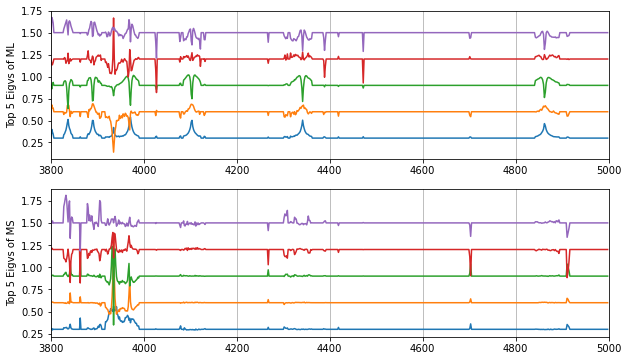

In [24]:
f, axs = plt.subplots(2,1,figsize=(10,6), facecolor="w")
ds.plot_eigv(MLv, name="ML", ax=axs[0])
ds.plot_eigv(MSv, name="MS", ax=axs[1])

In [25]:
NL, NS, NLv, NSv = ds._pcp(ds.N, delta=1e-6, mu=None, lam=None, norm=None, maxiter=500)

9.831038 0.003525807279719099 258158.06


In [26]:
with h5py.File(PCP_PATH, 'a') as f:
    f.create_dataset("NL", data=cp.asnumpy(NL), shape=NL.shape)
    f.create_dataset("NS", data=cp.asnumpy(NS), shape=NS.shape)
    f.create_dataset("NLv", data=cp.asnumpy(NLv), shape=NLv.shape) 
    f.create_dataset("NSv", data=cp.asnumpy(NSv), shape=NSv.shape) 

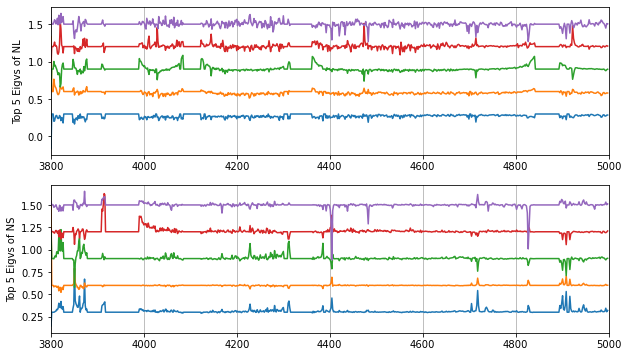

In [27]:
f, axs = plt.subplots(2,1,figsize=(10,6), facecolor="w")
ds.plot_eigv(NLv, name="NL", ax=axs[0])
ds.plot_eigv(NSv, name="NS", ax=axs[1])

In [28]:
pcp20 = cp.vstack([MLv[:5],MSv,NLv[:5],NSv])

In [29]:
pcp20.shape

(20, 686)

In [30]:
flux20 = cp.dot(ds.flux, pcp20.T)

In [31]:
flux20.shape

(80442, 20)

In [32]:
nflux20 = cp.asnumpy(flux20)

In [40]:
with h5py.File(PCP20_PATH, 'w') as f:
    f.create_dataset("flux", data=nflux20, shape=nflux20.shape)
    f.create_dataset("para", data=paraa, shape=paraa.shape)    

In [34]:
for i in range(20):
    ds.dfpara[f"p{i}"] = nflux20[:,i]

In [35]:
df = ds.dfpara

In [36]:
import seaborn as sns

In [39]:
PP = [f"p{i}" for i in range(20)]

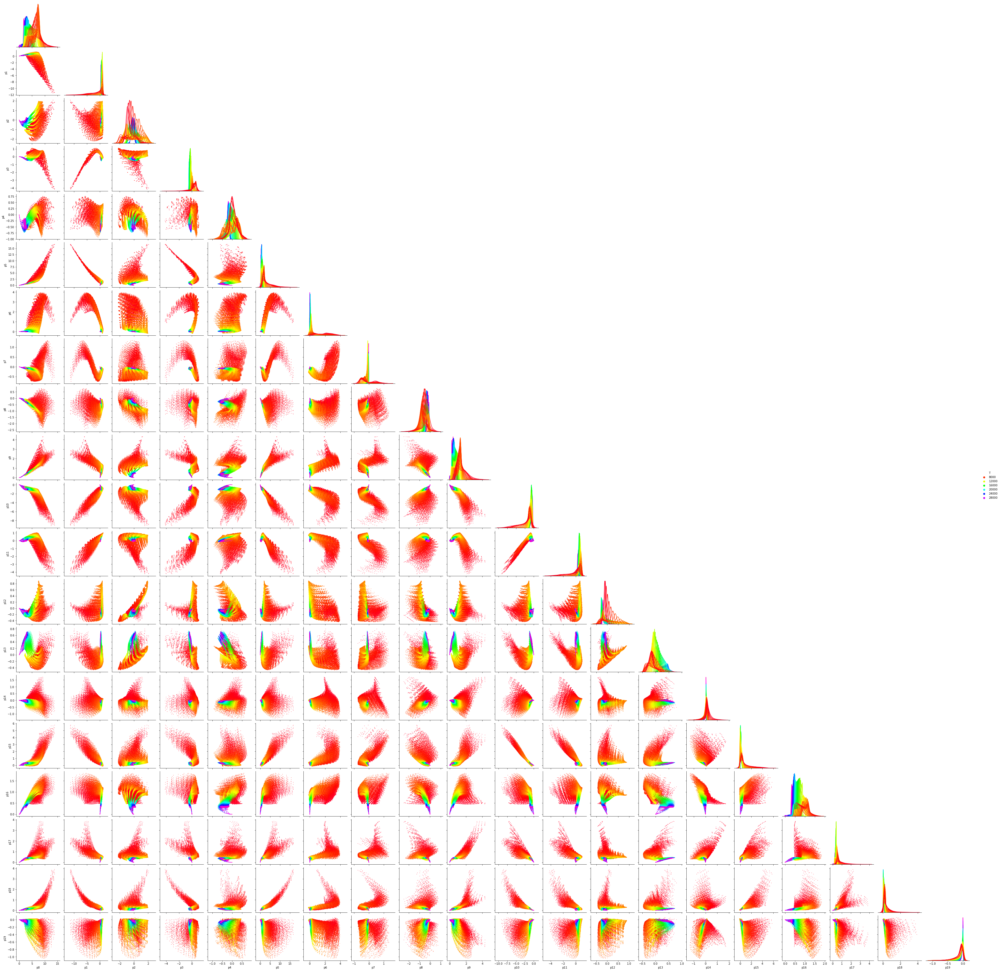

In [42]:
sns.pairplot(
    df,
    x_vars=PP,
    y_vars=PP,
    hue="T",
    plot_kws=dict(marker="o", s=2, edgecolor="none"),
    diag_kws=dict(fill=False),
    palette="gist_rainbow",
    corner=True
)

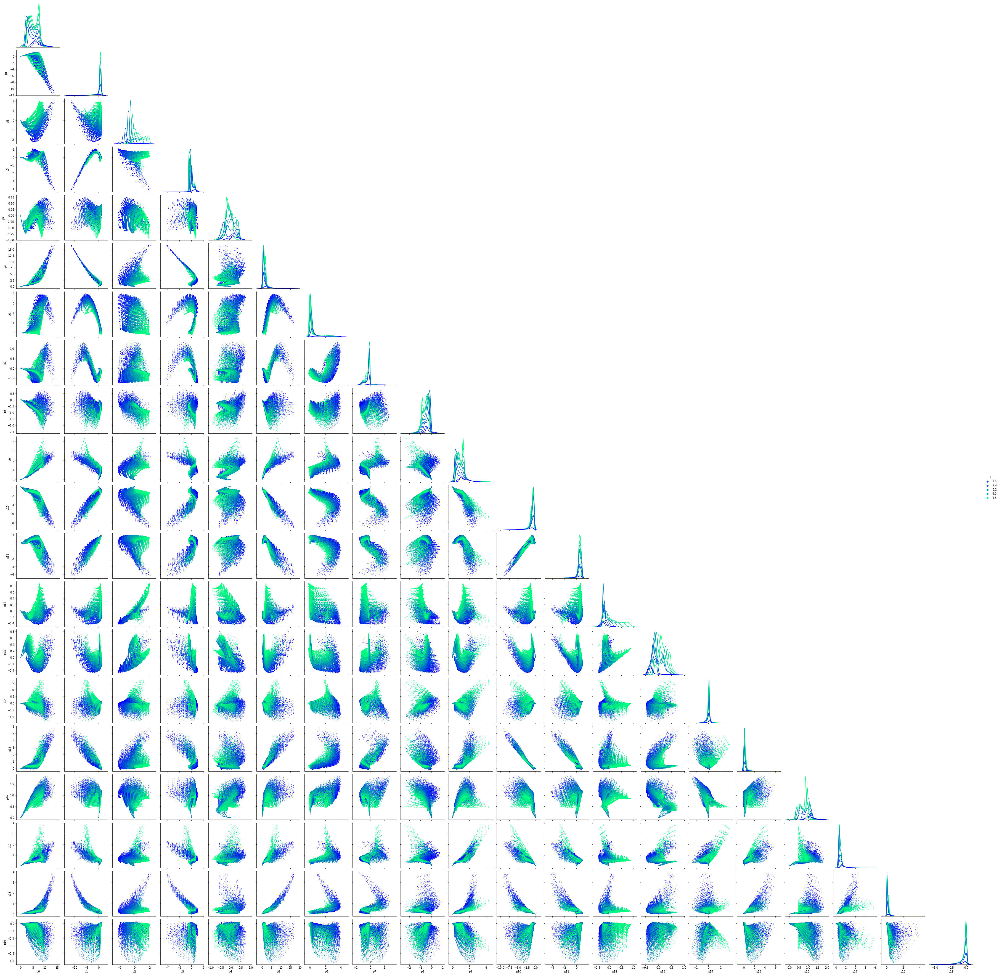

In [43]:
sns.pairplot(
    df,
    x_vars=[f"p{i}" for i in range(20)],
    y_vars=[f"p{i}" for i in range(20)],
    hue="L",
    plot_kws=dict(marker="o", s=2, edgecolor="none"),
    diag_kws=dict(fill=False),
    palette="winter",
    corner=True
)

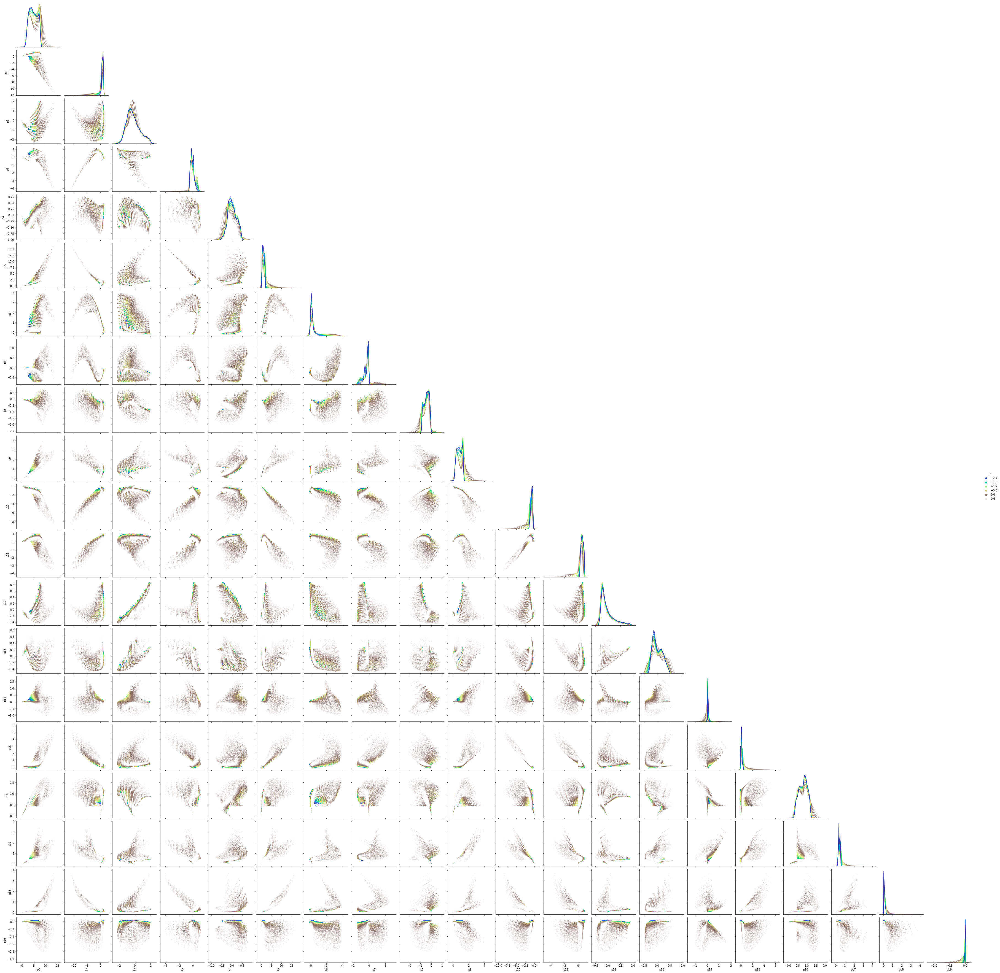

In [44]:
sns.pairplot(
    df,
    x_vars=[f"p{i}" for i in range(20)],
    y_vars=[f"p{i}" for i in range(20)],
    hue="F",
    plot_kws=dict(marker="o", s=2, edgecolor="none"),
    diag_kws=dict(fill=False),
    palette="terrain",
    corner=True
)

In [45]:
df

,F,T,L,C,O,p0,p1,p2,p3,p4,...,p10,p11,p12,p13,p14,p15,p16,p17,p18,p19
2505,-2.50,6500.0,1.0,-0.50,-0.25,4.350148,0.318085,-1.116854,0.385589,-0.023960,...,-0.771572,0.558261,-0.154533,-0.227659,0.151965,0.095080,0.792252,0.459680,0.086242,-0.008857
2506,-2.50,6500.0,1.0,-0.50,0.00,4.433482,0.141306,-1.163785,0.491389,0.001733,...,-0.792789,0.553651,-0.161225,-0.236782,0.150098,0.103767,0.794511,0.468783,0.094150,-0.012636
2507,-2.50,6500.0,1.0,-0.50,0.25,4.548351,-0.094746,-1.222634,0.612013,0.040102,...,-0.825396,0.550406,-0.170360,-0.246146,0.148537,0.120602,0.798542,0.486168,0.103627,-0.018191
2508,-2.50,6500.0,1.0,-0.50,0.50,4.681265,-0.397124,-1.293573,0.739842,0.080708,...,-0.851252,0.537753,-0.178485,-0.256628,0.143110,0.128875,0.799552,0.492477,0.114236,-0.023614
2509,-2.50,6500.0,1.0,-0.25,-0.25,4.366005,0.316096,-1.115551,0.381753,-0.012212,...,-0.790516,0.568716,-0.158573,-0.226666,0.154275,0.110241,0.798943,0.476673,0.086283,-0.010794
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116609,0.75,30000.0,5.0,0.25,0.50,2.709073,0.276251,0.261045,-0.305247,-0.556020,...,-1.120689,-0.075811,-0.066417,0.650515,-0.089341,0.402367,0.303863,0.391610,0.152061,-0.075650
116610,0.75,30000.0,5.0,0.50,-0.25,2.548867,0.312558,0.105567,-0.327319,-0.449242,...,-0.911418,0.031064,-0.073416,0.556835,-0.021232,0.295817,0.296602,0.361112,0.120585,-0.033332
116611,0.75,30000.0,5.0,0.50,0.00,2.583922,0.299469,0.146294,-0.320975,-0.480866,...,-0.971876,0.000346,-0.068599,0.585262,-0.038491,0.325663,0.297171,0.372057,0.128898,-0.043149
116612,0.75,30000.0,5.0,0.50,0.25,2.625230,0.284300,0.196704,-0.312727,-0.520273,...,-1.043130,-0.040464,-0.062840,0.618118,-0.060548,0.360992,0.296533,0.382613,0.138849,-0.056726
